In [1]:
# https://towardsdatascience.com/anomaly-detection-time-series-4c661f6f165f
# https://towardsdatascience.com/implementing-facebook-prophet-efficiently-c241305405a3
import pandas as pd
from fbprophet import Prophet
import seaborn as sns
import matplotlib.pyplot as plt
import altair as alt
alt.renderers.enable('notebook')

%matplotlib inline

In [33]:
df=pd.read_csv('/home/jovyan/work/Prophet_forecasting/Data/test_detect_anoms.csv',sep=',')
df['timestamp'] = pd.to_datetime(df.timestamp)

df.columns = ['ts', 'y']
df['ds'] = pd.date_range('1/1/1960', periods = 14398, freq ='D')

df1 = df.head(1000)
df2 = df[7000:9000].reset_index(drop = True)
df3 = df[9000:9000+4999].reset_index(drop = True)

In [9]:
def fit_predict_model(dataframe, interval_width = 0.99, changepoint_range = 0.8):
    m = Prophet(daily_seasonality = False, yearly_seasonality = False, weekly_seasonality = False,
                seasonality_mode = 'multiplicative', 
                interval_width = interval_width,
                changepoint_range = changepoint_range)
    m = m.fit(dataframe)
    forecast = m.predict(dataframe)
    forecast['fact'] = dataframe['y'].reset_index(drop = True)
    return forecast

def detect_anomalies(forecast):
    forecasted = forecast[['ds','trend', 'yhat', 'yhat_lower', 'yhat_upper', 'fact']].copy()
    #forecast['fact'] = df['y']

    forecasted['anomaly'] = 0
    forecasted.loc[forecasted['fact'] > forecasted['yhat_upper'], 'anomaly'] = 1
    forecasted.loc[forecasted['fact'] < forecasted['yhat_lower'], 'anomaly'] = -1

    #anomaly importances
    forecasted['importance'] = 0
    forecasted.loc[forecasted['anomaly'] ==1, 'importance'] = \
        (forecasted['fact'] - forecasted['yhat_upper'])/forecast['fact']
    forecasted.loc[forecasted['anomaly'] ==-1, 'importance'] = \
        (forecasted['yhat_lower'] - forecasted['fact'])/forecast['fact']
    
    return forecasted
    
def plot_anomalies(forecasted):
    interval = alt.Chart(forecasted).mark_area(interpolate="basis", color = '#7FC97F').encode(
    x=alt.X('ds:T',  title ='date'),
    y='yhat_upper',
    y2='yhat_lower',
    tooltip=['ds', 'fact', 'yhat_lower', 'yhat_upper']
    ).interactive().properties(
        title='Anomaly Detection'
    )

    fact = alt.Chart(forecasted[forecasted.anomaly==0]).mark_circle(size=15, opacity=0.7, color = 'Black').encode(
        x='ds:T',
        y=alt.Y('fact', title='sales'),    
        tooltip=['ds', 'fact', 'yhat_lower', 'yhat_upper']
    ).interactive()

    anomalies = alt.Chart(forecasted[forecasted.anomaly!=0]).mark_circle(size=30, color = 'Red').encode(
        x='ds:T',
        y=alt.Y('fact', title='sales'),    
        tooltip=['ds', 'fact', 'yhat_lower', 'yhat_upper'],
        size = alt.Size( 'importance', legend=None)
    ).interactive()

    return alt.layer(interval, fact, anomalies)\
              .properties(width=870, height=450)\
              .configure_title(fontSize=20)

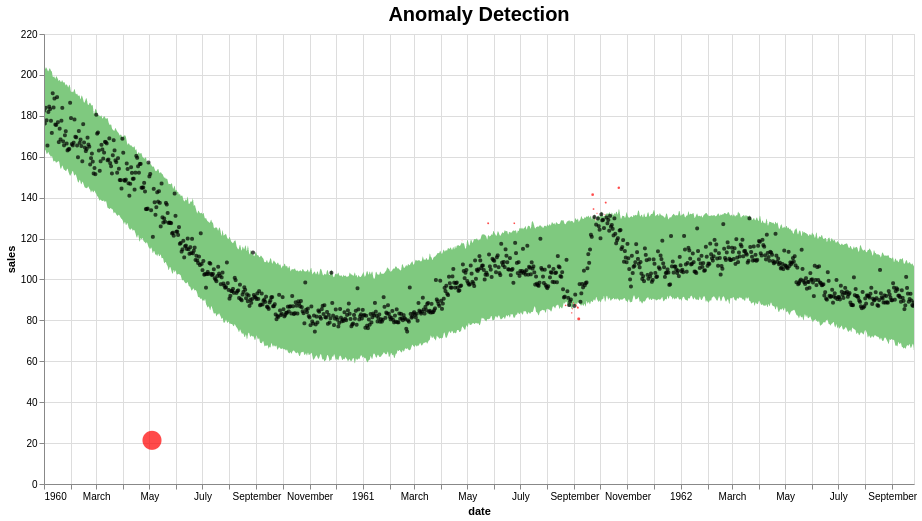

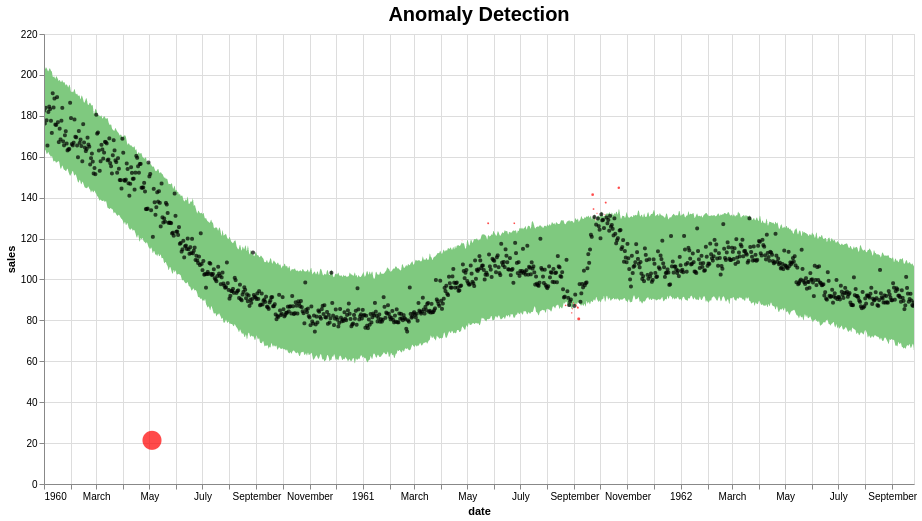

In [17]:
pred = fit_predict_model(df1)
pred = detect_anomalies(pred)
plot_anomalies(pred)

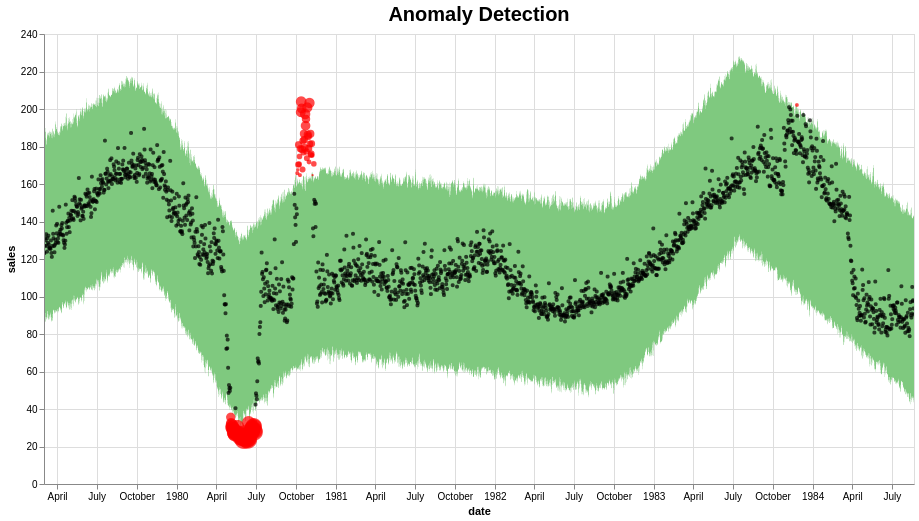

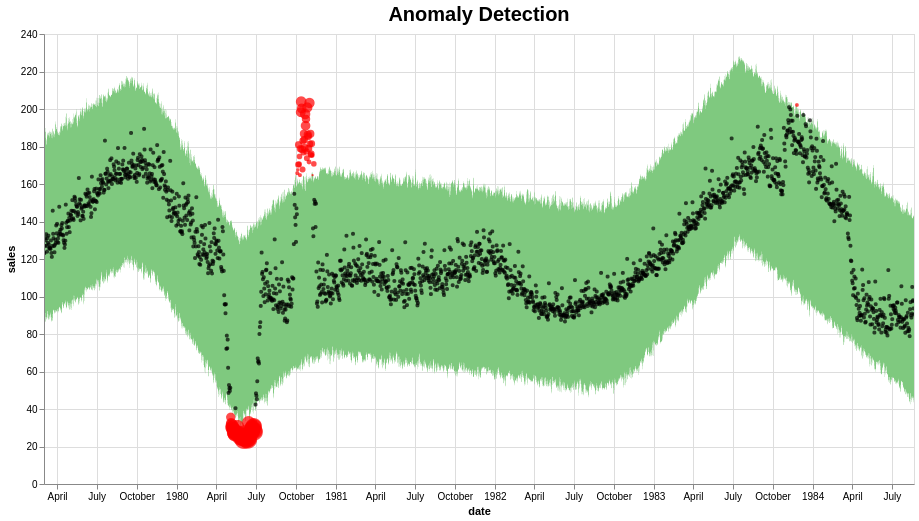

In [18]:
pred = fit_predict_model(df2)
pred = detect_anomalies(pred)
plot_anomalies(pred)

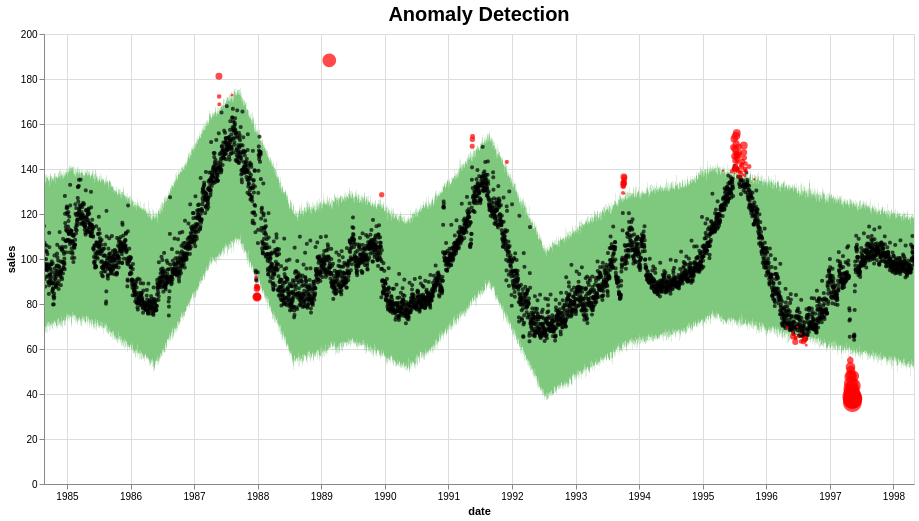

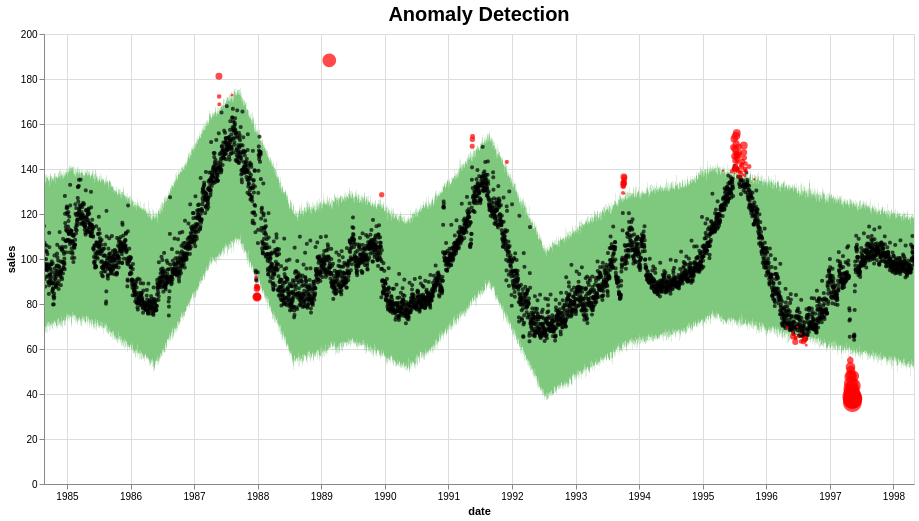

In [19]:
pred = fit_predict_model(df3)
pred = detect_anomalies(pred)
plot_anomalies(pred)

### Prediction

In [20]:
m = Prophet()
m.fit(df)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [21]:
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
14758,2000-05-28
14759,2000-05-29
14760,2000-05-30
14761,2000-05-31
14762,2000-06-01


In [22]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
14758,2000-05-28,102.992537,72.963661,134.314103
14759,2000-05-29,103.078731,71.067577,132.359677
14760,2000-05-30,103.049471,71.615758,134.693740
14761,2000-05-31,102.874525,71.584268,132.476128
14762,2000-06-01,102.933467,71.535811,131.765937


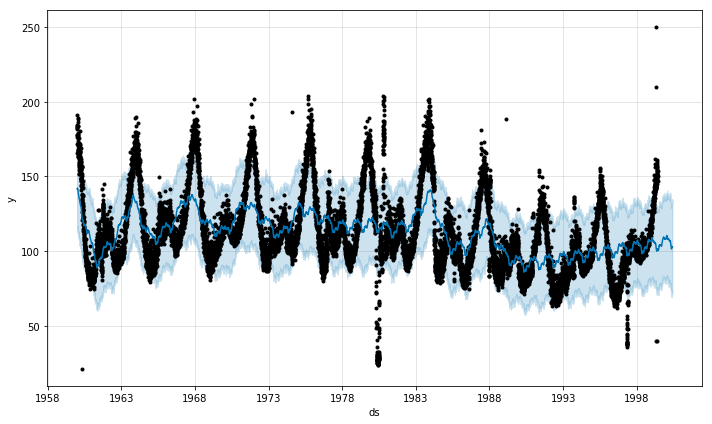

In [23]:
fig1 = m.plot(forecast)

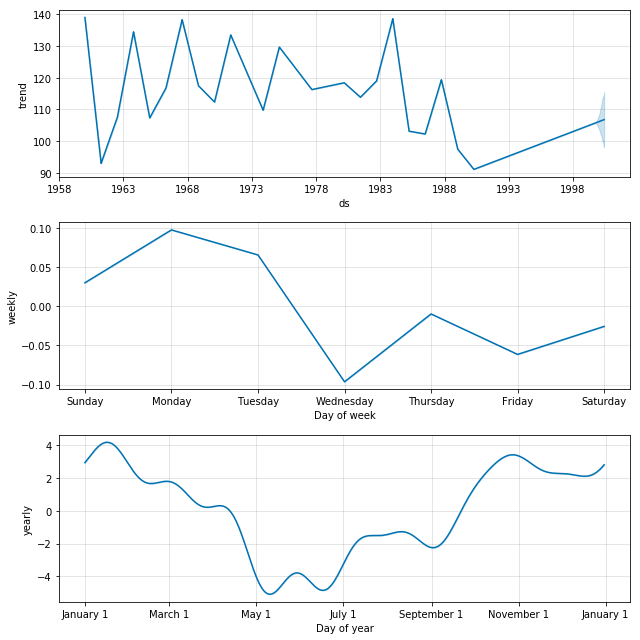

In [24]:
fig2 = m.plot_components(forecast)

In [25]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(m, forecast)  # This returns a plotly Figure
py.iplot(fig)

#### Fourier Order for Seasonalities
The default values are often appropriate, but they can be increased when the seasonality needs to fit higher-frequency changes, and generally be less smooth. The Fourier order can be specified for each built-in seasonality when instantiating the model, here it is increased to 20:

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


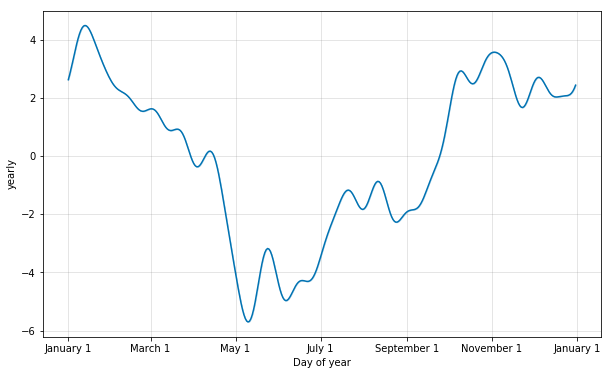

In [5]:
from fbprophet.plot import plot_yearly
m2 = Prophet(yearly_seasonality=20).fit(df)
a = plot_yearly(m2)

#### Specifying Custom Seasonalities
This replace the weekly seasonality with monthly seasonality. The monthly seasonality then will appear in the components plot:

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


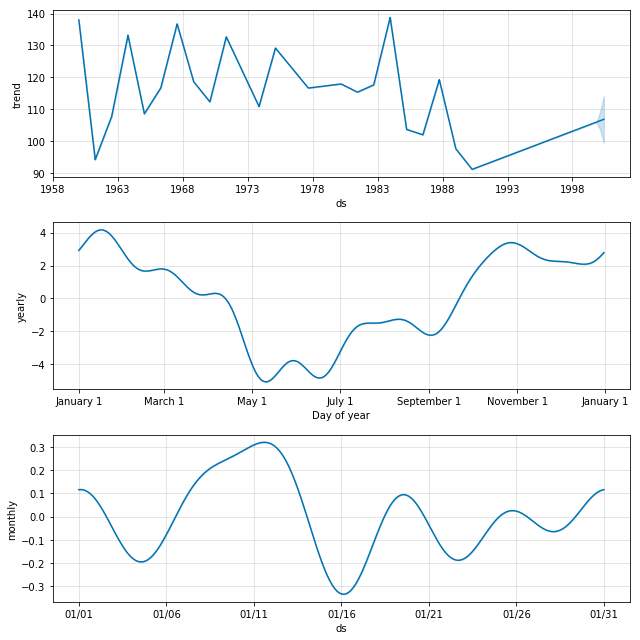

In [10]:
m3 = Prophet(weekly_seasonality=False)
m3.add_seasonality(name='monthly', period=30.5, fourier_order=5)
forecast = m3.fit(df)
future = m3.make_future_dataframe(periods=365)
forecast = forecast.predict(future)
fig = m3.plot_components(forecast)

#### Seasonalities that depend on other factors
Patrón estacional semanal que puede ser distinto es distintas épocas del año

In [10]:
def is_nfl_season(ds):
    date = pd.to_datetime(ds)
    return (date.month > 8 or date.month < 2)

df['on_season'] = df['ds'].apply(is_nfl_season)
df['off_season'] = ~df['ds'].apply(is_nfl_season)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


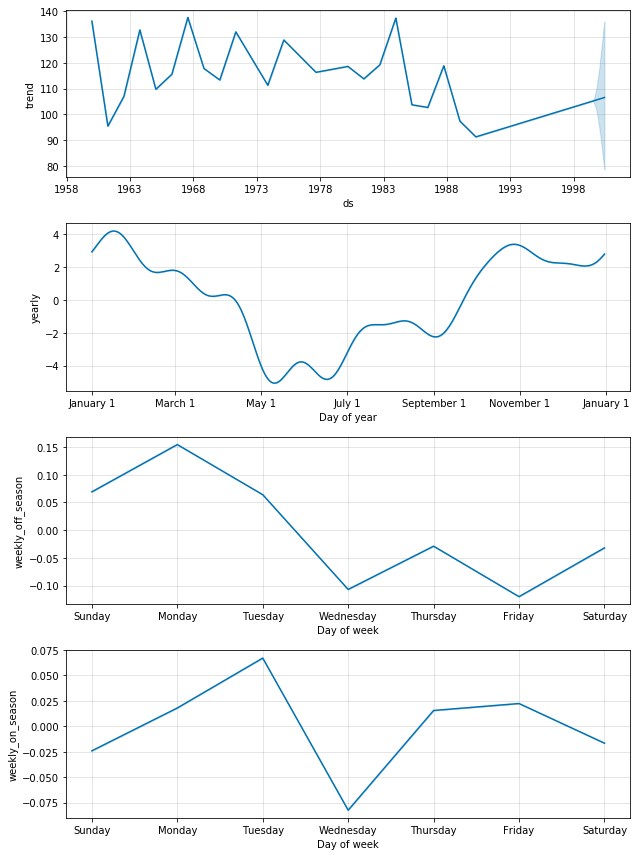

In [15]:
m4 = Prophet(weekly_seasonality=False,interval_width=0.95)
m4.add_seasonality(name='weekly_on_season', period=7, fourier_order=3, condition_name='on_season')
m4.add_seasonality(name='weekly_off_season', period=7, fourier_order=3, condition_name='off_season')

forecast = m4.fit(df)
future = m4.make_future_dataframe(periods=365)

future['on_season'] = future['ds'].apply(is_nfl_season)
future['off_season'] = ~future['ds'].apply(is_nfl_season)
forecast = forecast.predict(future)
fig = m4.plot_components(forecast)

#### Uncertainty in seasonality
mcmc.samples (full Bayesian sampling) To get uncertainty in seasonality.
Default mcmc.samples = 0

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


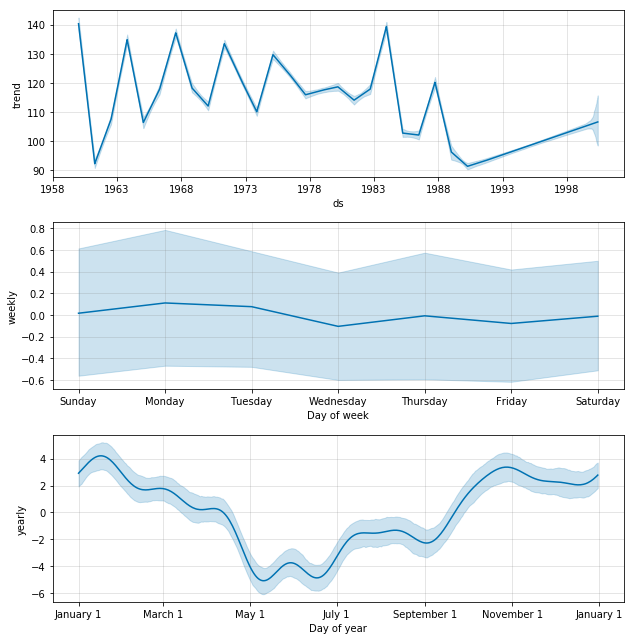

In [18]:
m5 = Prophet(mcmc_samples=300)
forecast = m5.fit(df)
future = m5.make_future_dataframe(periods=365)
forecast = forecast.predict(future)
fig = m5.plot_components(forecast)

### Diagnostics
Cross validation to measure forecast error using historical data.

In [21]:
# Initial: Periodo historico
# Period: Distancia entre las fechas de corte
# Horizon: Horizonte de predicción
from fbprophet.diagnostics import cross_validation
df_cv = cross_validation(m, initial='730 days', period='180 days', horizon = '365 days')
df_cv.head()

INFO:fbprophet:Making 74 forecasts with cutoffs between 1962-06-11 00:00:00 and 1998-06-02 00:00:00


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1962-06-12,100.272786,90.915090,108.951860,97.1723,1962-06-11
1,1962-06-13,99.235881,90.211491,108.413380,97.3690,1962-06-11
2,1962-06-14,100.108387,90.114905,109.285172,97.6363,1962-06-11
3,1962-06-15,100.177804,91.007617,109.036130,92.1865,1962-06-11
4,1962-06-16,100.131636,91.673899,110.413334,93.7878,1962-06-11


In [22]:
# Metrics
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,coverage
0,37 days,652.002451,25.534339,20.305895,0.180648,0.571640
1,38 days,663.351109,25.755603,20.476770,0.180940,0.567938
2,39 days,669.235545,25.869587,20.560365,0.181092,0.566087
3,40 days,675.560430,25.991545,20.669528,0.181748,0.563865
4,41 days,679.915688,26.075193,20.753811,0.182235,0.562014


In [36]:
avg_rmse1 = df_p['rmse'].mean()
avg_mae1 = df_p['mae'].mean()
avg_mape = df_p['mape'].mean()
print('RMSE: %s' % (avg_rmse1))
print('MAE: %s' % (avg_mae1))
print('Precisión: %s' % (100-avg_mape) + ' %')

RMSE: 39.14910455015157
MAE: 30.786818516615554
Precisión: 99.71290595592149 %


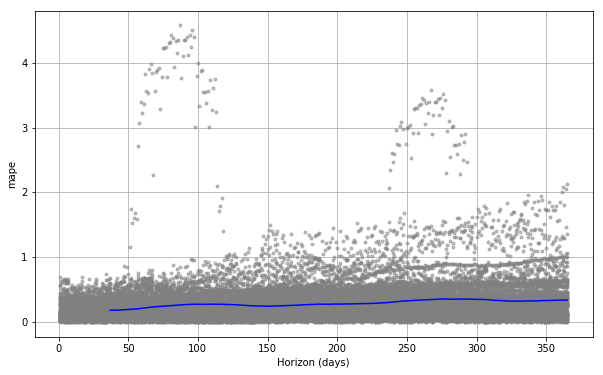

In [23]:
# Mean Absolute Percentage Error (MAPE)
from fbprophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')